# Part D: Replicating Paper

**Machine Learning in Finance: The Case of Deep Learning for Option Pricing** by R. Culkin & S.R. Das (2017)

In [ ]:
using Pkg
Pkg.activate(".")

In [24]:
using Pkg, MarketData, Dates, DataFrames, Statistics, StatsBase, ARCHModels, Flux, LinearAlgebra, GLM, 
Distributions, PrettyTables, StatsPlots, MLUtils, MLDataUtils, Optim, Random

**1. Generating data for call options according to ranges of values set in the paper and defining the Black-Scholes formula**

**Generating data based on value intervals given in the paper and defining the Black Sholes Formula for call options**

In [17]:
Random.seed!(123) 

TaskLocalRNG()

In [18]:
include("script.jl")
# Generate random input data
n = 300_000
S = rand(10.0:1.0:500.0, n)   # Stock price range: $10 to $500
K = rand(7.0:1.0:650.0, n)    # Strike price range: $7 to $650
T = rand(1/365:1/365:3.0, n)  # Maturity range: 1 day (1/365 year) to 3 years
q = rand(0.0:0.01:0.03, n)    # Dividend rate range: 0% to 3%
r = rand(0.01:0.01:0.03, n)   # Risk-free rate range: 1% to 3%
σ = rand(0.05:0.01:0.9, n)    # Volatility range: 5% to 90%


# Calculate call prices using the Black-Scholes formula included in script.jl
call_prices = [black_scholes_call(S[i], K[i], T[i], q[i], r[i], σ[i]) for i in 1:n]

# Store data in a DataFrame
using DataFrames
df = DataFrame(StockPrice = S, StrikePrice = K, Maturity = T, Dividends = q, RiskFreeRate = r, Volatility = σ, CallPrice = call_prices)
first(df,3)


Row,StockPrice,StrikePrice,Maturity,Dividends,RiskFreeRate,Volatility,CallPrice
,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,265.0,221.0,1.08219,0.0,0.01,0.7,94.1883
2,298.0,343.0,0.380822,0.01,0.03,0.51,22.1073
3,447.0,612.0,2.38904,0.0,0.01,0.55,105.921


As mentioned in the paper, we can normalize the data so that the strike price does not play a role because of the property of the Black-Sholes model that makes it linear homogeneous in stock price S and strike price K. Therefore, we can normalize the data by divding with stock and call price with option strike price.

In [20]:
df.StockPrice .= df.StockPrice ./ df.StrikePrice
df.CallPrice .= df.CallPrice ./ df.StrikePrice;

Splitting data into training and testing set, as it was done in the paper: 80/20%.

In [21]:
Random.seed!(123) 
# Define features (x) and target (y)
x = Matrix(df[:, [:StockPrice, :Maturity, :Dividends, :Volatility, :RiskFreeRate]])'  # Features as rows
y = df[:, :CallPrice]'  # Target as a row vector

# Perform train-test split
train_size = 0.8
(x_train, y_train), (x_test, y_test) = MLDataUtils.splitobs((x, y), at = train_size)

# Transpose back to original form if needed
x_train = x_train'
x_test = x_test'
y_train = vec(y_train)  # Convert back to a column vector
y_test = vec(y_test);

Random.seed!(123)  

n_train = Int(0.8 * n)
train_df = df[1:n_train, :]
test_df = df[n_train+1:end, :]

x_train = Matrix(train_df[:, [:StockPrice, :Maturity, :Dividends, :Volatility, :RiskFreeRate]])
y_train = train_df[:, :CallPrice]

x_test = Matrix(test_df[:, [:StockPrice, :Maturity, :Dividends, :Volatility, :RiskFreeRate]])
y_test = test_df[:, :CallPrice];


In [ ]:
# Normalize each feature in the training and testing sets
#x_train = (x_train .- mean(x_train, dims=1)) ./ std(x_train, dims=1);
#x_test = (x_test .- mean(x_test, dims=1)) ./ std(x_test, dims=1);

The original results are made by relying on a neural network of 6 input nodes which we've randomly stimulated, 4 hidden layers where each consists of 120 nodes and a single output node (many-to-one method).  
The authors rely on using a custom activation function that will be able to generate positive continious output. Sigmoid function was not an option due the limitation of (0,1), whereas the authors want a range that spans from zero to infinity.  
**Below, we define the custom actf for the output layer, the model itself and the loss function. As the optimizer, RMSprop is used, which is a gradient-based optimization technique**

In [26]:
# we use exponential custom actf to generate positive output
function custom_activation(x)
    return exp.(x)
end

drop=0.25
nodes = 120
model = Chain( Dense(size(x_train, 2), nodes, leakyrelu), Dropout(drop),
    Dense(nodes, nodes, elu), Dropout(drop),
    Dense(nodes, nodes, relu),Dropout(drop),
    Dense(nodes, nodes, elu),Dropout(drop),
    Dense(nodes, 1), custom_activation);
    

In [27]:
loss(x, y) = Flux.Losses.mse(model(x), y)

optimizer = RMSProp(0.001)  # learning rate
epochs = 10
batch_size = 64

for epoch in 1:epochs
    for (x, y) in Flux.DataLoader((x_train', y_train'), batchsize=batch_size, shuffle=true)
        gs = Flux.gradient(() -> loss(x, y), Flux.params(model))
        Flux.Optimise.update!(optimizer, Flux.params(model), gs)
    end
    train_loss = loss(x_train', y_train')
    println("Epoch: $epoch, Training Loss: $train_loss")
end

Epoch: 1, Training Loss: 0.0034933163851856197
Epoch: 2, Training Loss: 0.005657332633217762
Epoch: 3, Training Loss: 0.004662398176384523
Epoch: 4, Training Loss: 0.005646024485848561
Epoch: 5, Training Loss: 0.0014573379338001491
Epoch: 6, Training Loss: 0.002698068957516955
Epoch: 7, Training Loss: 0.00028132869725349665
Epoch: 8, Training Loss: 0.0012587647481301896
Epoch: 9, Training Loss: 0.0010171917941419154
Epoch: 10, Training Loss: 0.0025857146103534755


In [31]:
# Make predictions for the training and testing sets
y_pred_train = vec(model(x_train'))
y_pred_test = vec(model(x_test'))

# Calculate and print evaluation metrics for training set
mse_train = mean((y_train - y_pred_train).^2)
rmse_train = sqrt(mse_train)
mae_train = mean(abs.(y_train - y_pred_train))


# Calculate and print evaluation metrics for testing set
mse_test = mean((y_test - y_pred_test).^2)
rmse_test = sqrt(mse_test)
mae_test = mean(abs.(y_test - y_pred_test))

# Print metrics
println("Training Loss Functions: MSE = $mse_train, RMSE = $rmse_train, MAE = $mae_train")
println("Testing Loss Functions: MSE = $mse_test, RMSE = $rmse_test, MAE = $mae_test")

Training Loss Functions: MSE = 0.0025857146103534755, RMSE = 0.050849922422295545, MAE = 0.007270702944123673
Testing Loss Functions: MSE = 0.0033318488042852427, RMSE = 0.057722169088533413, MAE = 0.0076350515113101924


In [35]:
first(DataFrame(set = ["Training", "Testing"],MSE = [mse_train, mse_test],RMSE = [rmse_train, rmse_test],MAE = [mae_train, round(mae_test, digits=7)]),4)

Row,set,MSE,RMSE,MAE
,String,Float64,Float64,Float64
1,Training,0.00258571,0.0508499,0.0072707
2,Testing,0.00333185,0.0577222,0.0076351


In [36]:
using GLM

# In-sample R^2
in_sample_reg = lm(@formula(y ~ x), DataFrame(y=y_train, x=y_pred_train))
println("In-Sample R²: ", r2(in_sample_reg))

# Out-of-sample R^2
out_sample_reg = lm(@formula(y ~ x), DataFrame(y=y_test, x=y_pred_test))
println("Out-of-Sample R²: ", r2(out_sample_reg))


In-Sample R²: 0.9888100235393394
Out-of-Sample R²: 0.9872869483887482


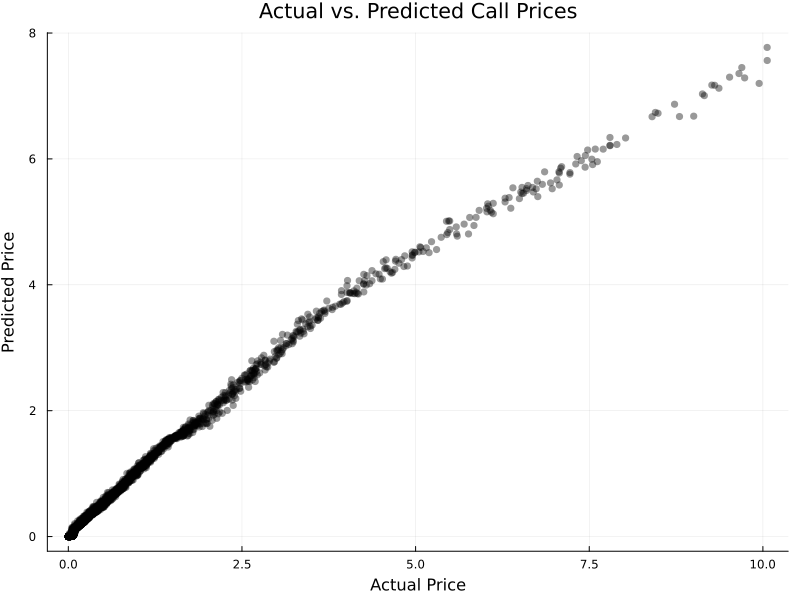

In [37]:
# Scatter plot of Actual vs. Predicted Price
scatter(y_test, y_pred_test, color=:black, alpha=0.4, size=(800, 600), legend=false)
xlabel!("Actual Price")
ylabel!("Predicted Price")
title!("Actual vs. Predicted Call Prices")